In [1]:
# Basic

import warnings
warnings.filterwarnings('ignore')

import os
from os import makedirs # make directory
from os import listdir # list directories
from shutil import copyfile
from random import seed
from random import random
import numpy as np
import pandas as pd
import cv2

# visuals
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.image import imread # Used to read images
from PIL import Image # Image Visulization

# Scikit-learn
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report,confusion_matrix,ConfusionMatrixDisplay

# Tensorflow
import tensorflow as tf
from tensorflow.keras.models import Sequential 
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.layers import Dense,MaxPooling2D,Dropout,Flatten,BatchNormalization,Conv2D
from tensorflow.keras.callbacks import ReduceLROnPlateau,EarlyStopping

In [2]:
# Đường dẫn đến thư mục chứa hình ảnh
image_folder_train = r"C:\Users\Admin\Documents\DPL302m\Kaggle competition\Flood Data\devset_images"
image_folder_test = r"C:\Users\Admin\Documents\DPL302m\Kaggle competition\Flood Data\testset_images"

In [3]:
# Đường dẫn đến tệp CSV
csv_file = r'C:\Users\Admin\Documents\DPL302m\Kaggle competition\Flood Data\devset_images_gt.csv'  

# Đọc tệp CSV chứa tên hình ảnh và nhãn
df_csv = pd.read_csv(csv_file)

# Xác minh đường dẫn đầy đủ và tính nhất quán
df_csv['full_path'] = image_folder_train + '/' + df_csv['id'].astype(str)  # Tạo đường dẫn đầy đủ


In [4]:
# Tạo một hàm để ánh xạ nhãn
def map_label_to_binary(label):
    if label == 0:
        return 'non-flood'
    elif label == 1:
        return 'flood'
    else:
        return None  # Trường hợp nhãn không xác định

# Áp dụng hàm ánh xạ vào cột 'label' và tạo cột 'labels'
df_csv['label'] = df_csv['label'].apply(map_label_to_binary)

# In ra một số dòng đầu của DataFrame sau khi thêm cột 'labels'
df_csv.head(10)


,id,label,full_path
0,3519864665,non-flood,C:\Users\Admin\Documents\DPL302m\Kaggle compet...
1,4896119055,non-flood,C:\Users\Admin\Documents\DPL302m\Kaggle compet...
2,3468473862,non-flood,C:\Users\Admin\Documents\DPL302m\Kaggle compet...
3,4120853942,non-flood,C:\Users\Admin\Documents\DPL302m\Kaggle compet...
4,4436083254,non-flood,C:\Users\Admin\Documents\DPL302m\Kaggle compet...
5,4687941690,non-flood,C:\Users\Admin\Documents\DPL302m\Kaggle compet...
6,6041476795,non-flood,C:\Users\Admin\Documents\DPL302m\Kaggle compet...
7,8431249158,non-flood,C:\Users\Admin\Documents\DPL302m\Kaggle compet...
8,8564707991,flood,C:\Users\Admin\Documents\DPL302m\Kaggle compet...
9,3259293162,flood,C:\Users\Admin\Documents\DPL302m\Kaggle compet...


- Label 0 : no flood
- Label 1 : flood

In [5]:
# Kiểm tra sự nhất quán giữa tên tệp trong thư mục và các giá trị trong cột 'id'
files_in_folder = os.listdir(image_folder_train)
df_csv = df_csv[~df_csv['id'].isin(files_in_folder)]

df_csv

,id,label,full_path
0,3519864665,non-flood,C:\Users\Admin\Documents\DPL302m\Kaggle compet...
1,4896119055,non-flood,C:\Users\Admin\Documents\DPL302m\Kaggle compet...
2,3468473862,non-flood,C:\Users\Admin\Documents\DPL302m\Kaggle compet...
3,4120853942,non-flood,C:\Users\Admin\Documents\DPL302m\Kaggle compet...
4,4436083254,non-flood,C:\Users\Admin\Documents\DPL302m\Kaggle compet...
...,...,...,...
5275,8119782888,non-flood,C:\Users\Admin\Documents\DPL302m\Kaggle compet...
5276,6093294301,flood,C:\Users\Admin\Documents\DPL302m\Kaggle compet...
5277,6791185487,non-flood,C:\Users\Admin\Documents\DPL302m\Kaggle compet...
5278,9144682941,non-flood,C:\Users\Admin\Documents\DPL302m\Kaggle compet...


## Visualize images and labels

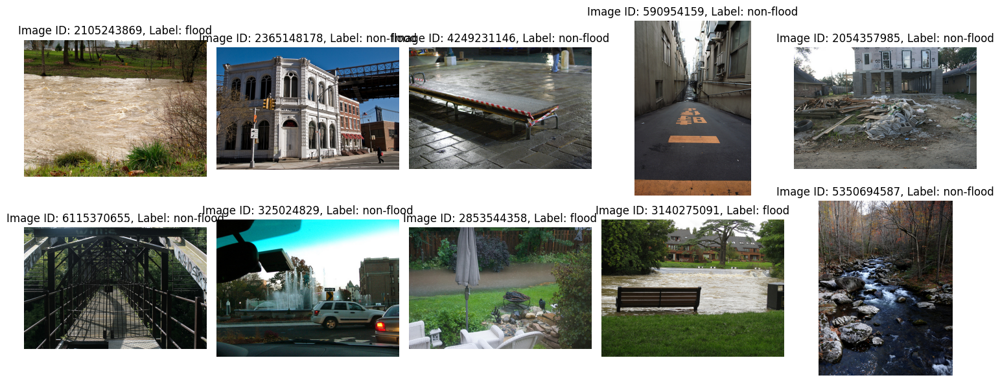

In [19]:
# Số lượng hàng và cột trong lưới
num_rows = 2
num_cols = 5
num_images_to_check = num_rows * num_cols

# Lấy một mẫu ngẫu nhiên từ DataFrame
random_sample = df_csv.sample(n=num_images_to_check)

# Tạo lưới
fig, axes = plt.subplots(num_rows, num_cols, figsize=(15, 6))

# Lặp qua mỗi hình ảnh trong mẫu ngẫu nhiên
for i, (_, row) in enumerate(random_sample.iterrows()):
    # Lấy đường dẫn đầy đủ từ DataFrame
    image_path = row['full_path']
    
    # Kiểm tra xem hình ảnh có tồn tại không
    if os.path.exists(image_path + '.jpg'):
        image_path = image_path + '.jpg'
    elif os.path.exists(image_path + '.png'):
        image_path = image_path + '.png'
    else:
        print(f"Không tìm thấy hình ảnh tại đường dẫn: {image_path}")
        continue

    # Đọc hình ảnh từ đường dẫn đầy đủ và hiển thị nó
    image = cv2.imread(image_path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  # Chuyển đổi sang định dạng mà matplotlib hiểu được
    
    # Lấy thông tin từ cột 'id' và 'label'
    image_id = row['id']
    label = row['label']
    
    # Tính toán vị trí trong lưới
    row = i // num_cols
    col = i % num_cols
    
    # Hiển thị hình ảnh và thông tin trong ô lưới tương ứng
    axes[row, col].imshow(image)
    axes[row, col].set_title(f"Image ID: {image_id}, Label: {label}")
    axes[row, col].axis('off')

# Hiển thị lưới
plt.tight_layout()
plt.show()


## Visualize the countplot of the data

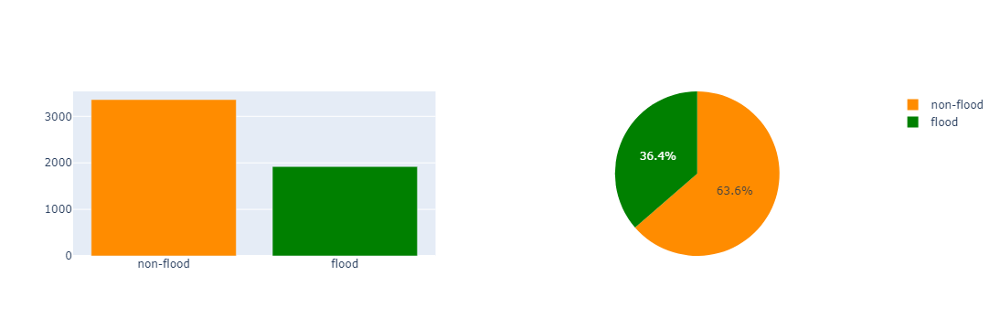

In [20]:
from plotly.subplots import make_subplots
import plotly.graph_objects as go

fig = make_subplots(rows=1, cols=2, specs=[[{"type": "xy"}, {"type": "pie"}]])


fig.add_trace(go.Bar(x =df_csv['label'].value_counts().index,y=df_csv['label'].value_counts().to_numpy(),marker_color=['darkorange','green'],showlegend=False),row=1,col=1)

fig.add_trace(go.Pie(
     values=df_csv['label'].value_counts().to_numpy(),
     labels=df_csv['label'].value_counts().index,
    marker=dict(colors=['darkorange','green'])),
    row=1, col=2)

- Flood has 1920 images
- No Flood has 3360 images
  #### Flood labels have less number of images. The data set is imbalanced

## Visualizing the images with flood

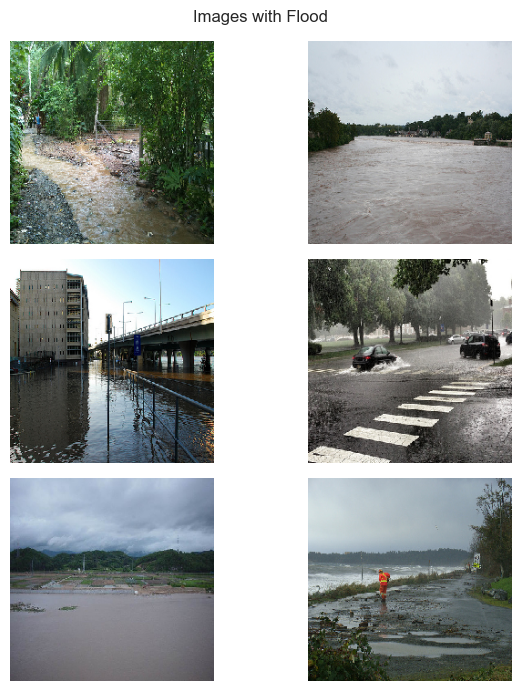

In [26]:
import matplotlib.pyplot as plt
from keras.preprocessing import image
import seaborn as sns

label = 'flood'  # Nhãn cho hình ảnh lũ lụt
data = df_csv[df_csv['labels'] == label]
sns.set_style('dark')

pics = 6  # Số lượng hình ảnh
fig, ax = plt.subplots(int(pics // 2), 2, figsize=(7, 7))
plt.suptitle('Images with Flood')
ax = ax.ravel()

for i in range(pics):
    path = data.sample(1)['full_path'].iloc[0]  # Lấy đường dẫn ngẫu nhiên từ dữ liệu
    path_with_extension = path + '.jpg'  # Thêm phần mở rộng .jpg vào đường dẫn
    img = image.load_img(path_with_extension, target_size=(224, 224))  # Load hình ảnh với kích thước đã chọn
    img = image.img_to_array(img) / 255.0  # Chuyển đổi hình ảnh thành mảng numpy và chuẩn hóa
    ax[i].imshow(img)
    ax[i].axis('off')

plt.tight_layout()
plt.show()


## Visualizing the images with not flood

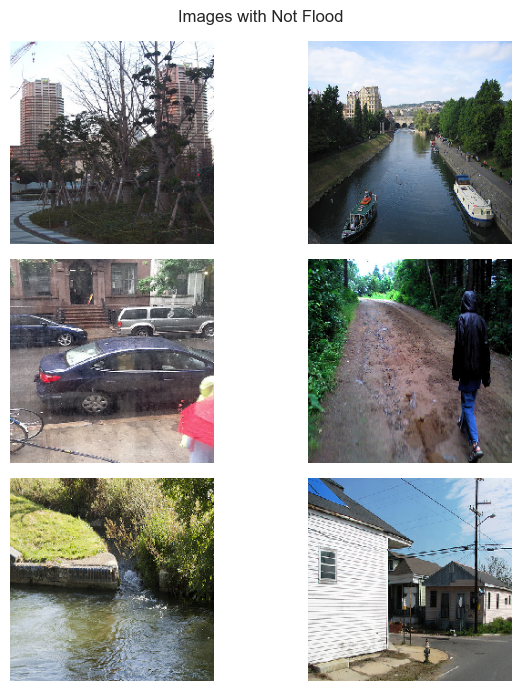

In [27]:
import matplotlib.pyplot as plt
from keras.preprocessing import image
import seaborn as sns

label = 'non-flood'  # Nhãn cho hình ảnh lũ lụt
data = df_csv[df_csv['labels'] == label]
sns.set_style('dark')

pics = 6  # Số lượng hình ảnh
fig, ax = plt.subplots(int(pics // 2), 2, figsize=(7, 7))
plt.suptitle('Images with Not Flood')
ax = ax.ravel()

for i in range(pics):
    path = data.sample(1)['full_path'].iloc[0]  # Lấy đường dẫn ngẫu nhiên từ dữ liệu
    path_with_extension = path + '.jpg'  # Thêm phần mở rộng .jpg vào đường dẫn
    img = image.load_img(path_with_extension, target_size=(224, 224))  # Load hình ảnh với kích thước đã chọn
    img = image.img_to_array(img) / 255.0  # Chuyển đổi hình ảnh thành mảng numpy và chuẩn hóa
    ax[i].imshow(img)
    ax[i].axis('off')

plt.tight_layout()
plt.show()


## Visualize the distribution of their shapes

In [13]:
from keras.preprocessing import image

def shaper(row):
    path_with_extension = row['full_path'] + '.jpg'  # Thêm phần mở rộng .jpg vào đường dẫn
    try:
        shape = image.load_img(path_with_extension).size  # Thử load hình ảnh
        row['height'] = shape[1]  # Gán chiều cao
        row['width'] = shape[0]  # Gán chiều rộng
    except FileNotFoundError:
        # Nếu không tìm thấy tệp hình ảnh, gán chiều cao và chiều rộng là None
        row['height'] = None
        row['width'] = None
    return row

# Áp dụng hàm shaper vào từng dòng của DataFrame dff
dff_shape = df_csv.apply(shaper, axis=1)

dff_shape.head()


,id,label,full_path,height,width
0,3519864665,non-flood,C:\Users\Admin\Documents\DPL302m\Kaggle compet...,333.0,500.0
1,4896119055,non-flood,C:\Users\Admin\Documents\DPL302m\Kaggle compet...,500.0,332.0
2,3468473862,non-flood,C:\Users\Admin\Documents\DPL302m\Kaggle compet...,500.0,375.0
3,4120853942,non-flood,C:\Users\Admin\Documents\DPL302m\Kaggle compet...,375.0,500.0
4,4436083254,non-flood,C:\Users\Admin\Documents\DPL302m\Kaggle compet...,375.0,500.0


## Data Processing:

In [6]:
# Xoá cột 'id' từ DataFrame
df_csv.drop(columns=['id'], inplace=True)

# Gán kết quả vào biến mới nếu cần
dff = df_csv.copy()


In [7]:
dff.sample(10)

,label,full_path
242,non-flood,C:\Users\Admin\Documents\DPL302m\Kaggle compet...
4247,flood,C:\Users\Admin\Documents\DPL302m\Kaggle compet...
1188,non-flood,C:\Users\Admin\Documents\DPL302m\Kaggle compet...
5017,non-flood,C:\Users\Admin\Documents\DPL302m\Kaggle compet...
5204,flood,C:\Users\Admin\Documents\DPL302m\Kaggle compet...
1771,flood,C:\Users\Admin\Documents\DPL302m\Kaggle compet...
4019,non-flood,C:\Users\Admin\Documents\DPL302m\Kaggle compet...
723,non-flood,C:\Users\Admin\Documents\DPL302m\Kaggle compet...
1677,non-flood,C:\Users\Admin\Documents\DPL302m\Kaggle compet...
2381,non-flood,C:\Users\Admin\Documents\DPL302m\Kaggle compet...


In [7]:
# # train test split using dataframe

# labels = dff['label']

# # 20% split

# # 80%.    20%
# X_train, X_temp = train_test_split(dff, test_size=0.2, stratify=labels, random_state = 42)

# label_test_val = X_temp['label']

# # 10%.   10%
# X_test, X_val = train_test_split(X_temp, test_size=0.5, stratify=label_test_val, random_state = 42)

# print('The shape of train data',X_train.shape) # 80%
# print('The shape of test data',X_test.shape) # 10%
# print('The shape of validation data',X_val.shape) #10%

The shape of train data (4224, 2)
The shape of test data (528, 2)
The shape of validation data (528, 2)


In [48]:
from sklearn.model_selection import train_test_split

# Giả sử dff là DataFrame chứa dữ liệu ban đầu và 'label' là cột nhãn
labels = dff['label']

# Chia dữ liệu thành 90% train và 10% validation
X_train, X_val = train_test_split(dff, test_size=0.2, stratify=labels, random_state=42)

# Kiểm tra kích thước của các tập dữ liệu
print('The shape of train data:', X_train.shape)  # 90%
print('The shape of validation data:', X_val.shape)  # 10%


The shape of train data: (4224, 2)
The shape of validation data: (1056, 2)


In [49]:
X_train

,label,full_path
3572,non-flood,C:\Users\Admin\Documents\DPL302m\Kaggle compet...
4765,flood,C:\Users\Admin\Documents\DPL302m\Kaggle compet...
3171,non-flood,C:\Users\Admin\Documents\DPL302m\Kaggle compet...
5122,non-flood,C:\Users\Admin\Documents\DPL302m\Kaggle compet...
2863,non-flood,C:\Users\Admin\Documents\DPL302m\Kaggle compet...
...,...,...
2941,non-flood,C:\Users\Admin\Documents\DPL302m\Kaggle compet...
3639,non-flood,C:\Users\Admin\Documents\DPL302m\Kaggle compet...
1368,non-flood,C:\Users\Admin\Documents\DPL302m\Kaggle compet...
185,flood,C:\Users\Admin\Documents\DPL302m\Kaggle compet...


In [50]:
labels.value_counts()

label
non-flood    3360
flood        1920
Name: count, dtype: int64

In [51]:
# Xác định các giá trị duy nhất trong cột 'label'
unique_labels = labels.unique()

# Đếm số lượng giá trị duy nhất
num_unique_labels = len(unique_labels)

# In ra các giá trị duy nhất và số lượng giá trị duy nhất
print("Các giá trị duy nhất trong cột 'label':", unique_labels)
print("Số lượng giá trị duy nhất trong cột 'label':", num_unique_labels)

Các giá trị duy nhất trong cột 'label': ['non-flood' 'flood']
Số lượng giá trị duy nhất trong cột 'label': 2


In [52]:
print(dff.info())
print(dff['label'].dtype)


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5280 entries, 0 to 5279
Data columns (total 2 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   label      5280 non-null   object
 1   full_path  5280 non-null   object
dtypes: object(2)
memory usage: 82.6+ KB
None
object


In [17]:
X_train.shape

(4224, 2)

In [19]:
X_val.shape

(528, 2)

In [26]:
# X_test.shape

(528, 2)

# Image Generation or Augmentation

In [53]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator

In [54]:
generator = ImageDataGenerator(
    rotation_range= 20,
    width_shift_range=0.1,
    height_shift_range=0.1,
    shear_range = 2,
    zoom_range=0.2,
    rescale = 1/255,
    validation_split=0.2,
)

In [55]:
# parameters
image_size = 256 # Size of the image
image_channel = 3 # Colour scale (RGB)
bat_size = 64 # Number of files/images processed at onc

In [56]:
# Creating image data generator
# Preprocess images ==> Feature Engineering for Images
train_datagen = generator

test_datagen = generator

In [57]:
import os

# Assuming all images are .jpg
image_extension = '.jpg'

# Correct the base path
base_path = r'C:\Users\Admin\Documents\DPL302m\Kaggle competition\Flood Data\devset_images'

# Function to correct paths
def correct_path(filename):
    return os.path.join(base_path, filename + image_extension)

# Apply the correction
X_train['full_path'] = X_train['full_path'].apply(lambda x: correct_path(os.path.basename(x)))
X_val['full_path'] = X_val['full_path'].apply(lambda x: correct_path(os.path.basename(x)))
# X_test['full_path'] = X_test['full_path'].apply(lambda x: correct_path(os.path.basename(x)))

# Verify the corrected paths
for path in X_train['full_path'].head():
    if not os.path.isfile(path):
        print(f"File not found: {path}")


In [58]:
X_train.head()

,label,full_path
3572,non-flood,C:\Users\Admin\Documents\DPL302m\Kaggle compet...
4765,flood,C:\Users\Admin\Documents\DPL302m\Kaggle compet...
3171,non-flood,C:\Users\Admin\Documents\DPL302m\Kaggle compet...
5122,non-flood,C:\Users\Admin\Documents\DPL302m\Kaggle compet...
2863,non-flood,C:\Users\Admin\Documents\DPL302m\Kaggle compet...


In [59]:
# Applying image data gernerator to train and test data

train_generator = train_datagen.flow_from_dataframe(X_train,
                                                    directory = r"C:\Users\Admin\Documents\DPL302m\Kaggle competition\Flood Data\devset_images",
                                                    x_col= 'full_path',
                                                    y_col= 'label',
                                                    batch_size = bat_size,
                                                    target_size = (image_size,image_size),
                                                     classes=['non-flood', 'flood']
                                                   )
val_generator = test_datagen.flow_from_dataframe(X_val, 
                                                 directory = r'C:\Users\Admin\Documents\DPL302m\Kaggle competition\Flood Data\devset_images',
                                                 x_col= 'full_path',
                                                 y_col= 'label',
                                                 batch_size = bat_size,
                                                 target_size = (image_size,image_size),
                                                 classes=['non-flood', 'flood']
                                                )
# test_generator = test_datagen.flow_from_dataframe(X_test, 
#                                                   directory = r'C:\Users\Admin\Documents\DPL302m\Kaggle competition\Flood Data\devset_images',
#                                                   x_col= 'full_path',
#                                                  y_col= 'label',
#                                                  batch_size = bat_size,
#                                                  target_size = (image_size,image_size),
#                                                  classes=['non-flood', 'flood']
#                                                 )

Found 4214 validated image filenames belonging to 2 classes.
Found 1051 validated image filenames belonging to 2 classes.


In [35]:
class_indices = {}
for key in train_generator.class_indices.keys():
    class_indices[train_generator.class_indices[key]] = key
    
print(class_indices)

{0: 'non-flood', 1: 'flood'}


In [36]:
class_indices = {}
for key in val_generator.class_indices.keys():
    class_indices[val_generator.class_indices[key]] = key
    
print(class_indices)

{0: 'non-flood', 1: 'flood'}


## Visualization Generated images in training set

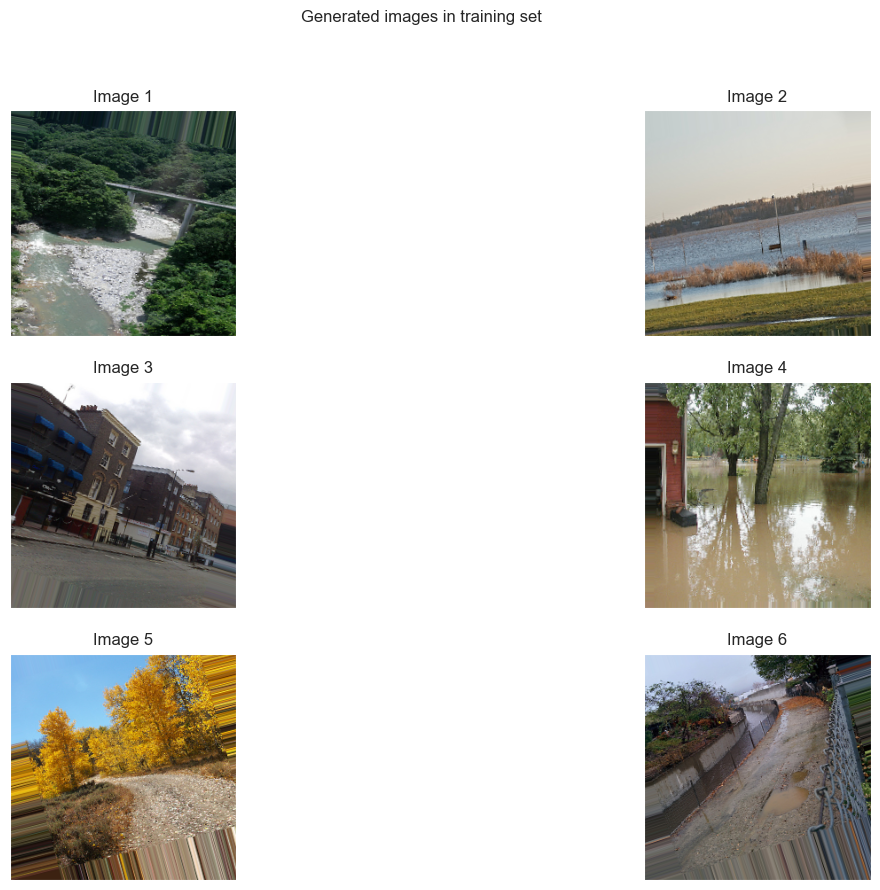

In [35]:
import matplotlib.pyplot as plt

sns.set_style('dark')
pics = 6  # set the number of pics
fig, ax = plt.subplots(int(pics // 2), 2, figsize=(15, 10))
plt.suptitle('Generated images in training set')
ax = ax.ravel()
for i in range((pics // 2) * 2):
    img = train_generator[0][0][i]
    ax[i].imshow(img)
    ax[i].axes.xaxis.set_visible(False)
    ax[i].axes.yaxis.set_visible(False)
    ax[i].set_title(f'Image {i+1}')  # Add a title for each image
plt.show()


# Model 1:

In [25]:
model = Sequential()

# Input Layer
model.add(Conv2D(32,(3,3),activation='relu',input_shape = (image_size,image_size,image_channel))) 
model.add(MaxPooling2D(pool_size=(2,2)))

# Block 1 
model.add(Conv2D(64,(3,3),activation='relu'))
model.add(MaxPooling2D(pool_size=(2,2)))

# Fully Connected layers 
model.add(Flatten())
model.add(Dense(512,activation='relu'))

# Output layer
model.add(Dense(2,activation='softmax')) # Softmax for binary classification

model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 254, 254, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 127, 127, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 125, 125, 64)   │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 62, 62, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 246016)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 512)            │   125,960,704 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 2)              │         1,026 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 125,981,122 (480.58 MB)

 Trainable params: 125,981,122 (480.58 MB)

 Non-trainable params: 0 (0.00 B)

In [26]:
learning_rate_reduction = ReduceLROnPlateau(monitor = 'val_accuracy',
                                            patience=2,
                                            factor=0.5,
                                            min_lr = 0.00001,
                                            verbose = 1)

early_stoping = EarlyStopping(monitor='val_loss',patience= 2,restore_best_weights=True,verbose=0)

In [27]:
model.compile(optimizer='adam',loss='binary_crossentropy',metrics=['accuracy'])

In [28]:
history1 = model.fit(train_generator,
                    validation_data = val_generator, 
                    callbacks=[learning_rate_reduction],
                    epochs = 10,
                    # steps_per_epoch = len(train_generator),
                    # validation_steps = len(val_generaotor),
                   )

Epoch 1/10
132/132 ━━━━━━━━━━━━━━━━━━━━ 701s 5s/step - accuracy: 0.6547 - loss: 2.5370 - val_accuracy: 0.7222 - val_loss: 0.5872 - learning_rate: 0.0010
Epoch 2/10
132/132 ━━━━━━━━━━━━━━━━━━━━ 427s 3s/step - accuracy: 0.7114 - loss: 0.5460 - val_accuracy: 0.7441 - val_loss: 0.5481 - learning_rate: 0.0010
Epoch 3/10
132/132 ━━━━━━━━━━━━━━━━━━━━ 419s 3s/step - accuracy: 0.7278 - loss: 0.5329 - val_accuracy: 0.7697 - val_loss: 0.5115 - learning_rate: 0.0010
Epoch 4/10
132/132 ━━━━━━━━━━━━━━━━━━━━ 657s 5s/step - accuracy: 0.7365 - loss: 0.5192 - val_accuracy: 0.7640 - val_loss: 0.4851 - learning_rate: 0.0010
Epoch 5/10
132/132 ━━━━━━━━━━━━━━━━━━━━ 0s 4s/step - accuracy: 0.7368 - loss: 0.5186
Epoch 5: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.
132/132 ━━━━━━━━━━━━━━━━━━━━ 590s 4s/step - accuracy: 0.7368 - loss: 0.5186 - val_accuracy: 0.7422 - val_loss: 0.5085 - learning_rate: 0.0010
Epoch 6/10
132/132 ━━━━━━━━━━━━━━━━━━━━ 565s 4s/step - accuracy: 0.7474 - loss: 0.502

In [29]:
history1.history

{'accuracy': [0.6834361553192139,
  0.7076411843299866,
  0.7233032584190369,
  0.7346938848495483,
  0.7358803749084473,
  0.7524917125701904,
  0.7472710013389587,
  0.7612719535827637,
  0.7676791548728943,
  0.7636449933052063],
 'loss': [1.0537744760513306,
  0.5565166473388672,
  0.535232663154602,
  0.519856870174408,
  0.5154096484184265,
  0.4953259825706482,
  0.4984205663204193,
  0.48427078127861023,
  0.47442391514778137,
  0.47087347507476807],
 'val_accuracy': [0.7221693396568298,
  0.744053304195404,
  0.7697430849075317,
  0.7640342712402344,
  0.7421503067016602,
  0.7887725830078125,
  0.7706945538520813,
  0.7859181761741638,
  0.7830637693405151,
  0.7849667072296143],
 'val_loss': [0.5871731638908386,
  0.548084557056427,
  0.5115312337875366,
  0.4851268231868744,
  0.508463978767395,
  0.48446550965309143,
  0.5117035508155823,
  0.4735833406448364,
  0.4773523807525635,
  0.46238863468170166],
 'learning_rate': [0.0010000000474974513,
  0.0010000000474974513,
 

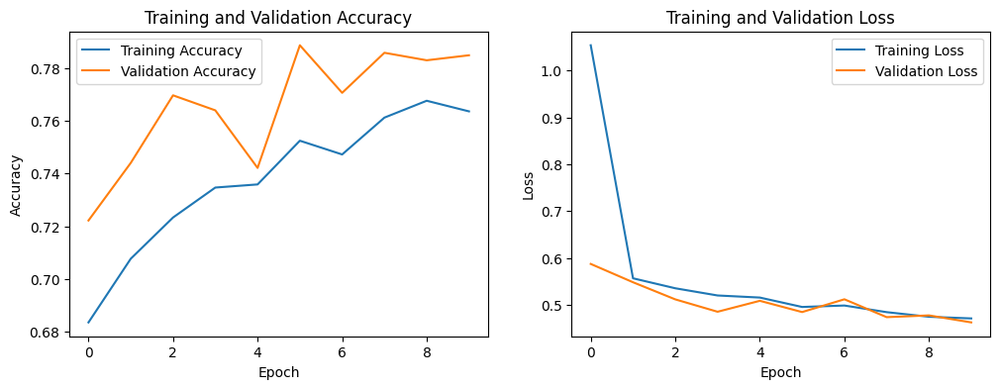

In [30]:
# Plotting the training and validation accuracy and loss
plt.figure(figsize=(12, 4))

plt.subplot(1, 2, 1)
plt.plot(history1.history['accuracy'], label='Training Accuracy')
plt.plot(history1.history['val_accuracy'], label='Validation Accuracy')
plt.title('Training and Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(history1.history['loss'], label='Training Loss')
plt.plot(history1.history['val_loss'], label='Validation Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

plt.show()

In [33]:
# Evaluate for train generator
loss,acc = model.evaluate(train_generator,batch_size = bat_size, verbose = 0)

print('The accuracy of the model for training data is:',acc*100)
print('The Loss of the model for training data is:',loss)

# Evaluvate for validation generator
loss,acc = model.evaluate(val_generator,batch_size = bat_size, verbose = 0)

print('The accuracy of the model for validation data is:',acc)
print('The Loss of the model for validation data is:',loss)

The accuracy of the model for training data is: 75.62885880470276
The Loss of the model for training data is: 0.48185524344444275
The accuracy of the model for validation data is: 0.7659372091293335
The Loss of the model for validation data is: 0.4651668667793274


In [69]:
# Tạo danh sách các tệp hình ảnh trong thư mục test
test_files = [os.path.join(image_folder_test, fname) for fname in os.listdir(image_folder_test) if fname.endswith('.jpg')]

In [70]:
# Tạo DataFrame từ danh sách tệp
test_df = pd.DataFrame({'full_path': test_files})

In [76]:
test_df = test_df.sample(50)
test_df

,full_path,predicted_label
1252,C:\Users\Admin\Documents\DPL302m\Kaggle compet...,1
881,C:\Users\Admin\Documents\DPL302m\Kaggle compet...,0
275,C:\Users\Admin\Documents\DPL302m\Kaggle compet...,0
179,C:\Users\Admin\Documents\DPL302m\Kaggle compet...,1
140,C:\Users\Admin\Documents\DPL302m\Kaggle compet...,0
785,C:\Users\Admin\Documents\DPL302m\Kaggle compet...,1
243,C:\Users\Admin\Documents\DPL302m\Kaggle compet...,0
1282,C:\Users\Admin\Documents\DPL302m\Kaggle compet...,0
748,C:\Users\Admin\Documents\DPL302m\Kaggle compet...,0
192,C:\Users\Admin\Documents\DPL302m\Kaggle compet...,0


# Model 2:

In [44]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout

model2 = Sequential()

model2.add(Conv2D(filters=32,kernel_size = (2,2),activation='relu',input_shape = (image_size,image_size,image_channel)))
model2.add(MaxPooling2D())

model2.add(Conv2D(filters=64,kernel_size=(2,2),activation='relu'))
model2.add(MaxPooling2D())

model2.add(Conv2D(filters=128,kernel_size=(2,2),activation='relu'))
model2.add(MaxPooling2D())

model2.add(Flatten())
model2.add(Dense(64,activation='relu'))
model2.add(Dense(32,activation = 'relu'))
model2.add(Dense(2,activation = 'softmax'))


model2.summary()


Model: "sequential_5"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_10 (Conv2D)              │ (None, 255, 255, 32)   │           416 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_9 (MaxPooling2D)  │ (None, 127, 127, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_11 (Conv2D)              │ (None, 126, 126, 64)   │         8,256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_10 (MaxPooling2D) │ (None, 63, 63, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_12 (Conv2D)              │ (None, 62, 62, 128)    │        32,896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_11 (MaxPooling2D) │ (None, 31, 31, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_3 (Flatten)             │ (None, 123008)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_9 (Dense)                 │ (None, 64)             │     7,872,576 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_10 (Dense)                │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_11 (Dense)                │ (None, 2)              │            66 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,916,290 (30.20 MB)

 Trainable params: 7,916,290 (30.20 MB)

 Non-trainable params: 0 (0.00 B)

In [50]:
learning_rate_reduction = ReduceLROnPlateau(monitor = 'val_accuracy',
                                            patience=2,
                                            factor=0.5,
                                            min_lr = 0.00001,
                                            verbose = 1)

early_stoping = EarlyStopping(monitor='val_loss',patience= 2,restore_best_weights=True,verbose=0)

In [51]:
model2.compile(optimizer='adam',loss='binary_crossentropy',metrics=['accuracy'])

In [53]:
history2 = model2.fit(train_generator,
                    validation_data = val_generator, 
                    callbacks=[learning_rate_reduction],
                    epochs = 15,
                    # steps_per_epoch = len(train_generator),
                    # validation_steps = len(val_generaotor),
                   )

Epoch 1/15
33/33 ━━━━━━━━━━━━━━━━━━━━ 352s 10s/step - accuracy: 0.7795 - loss: 0.4497 - val_accuracy: 0.8004 - val_loss: 0.4515 - learning_rate: 1.2500e-04
Epoch 2/15
33/33 ━━━━━━━━━━━━━━━━━━━━ 301s 8s/step - accuracy: 0.7789 - loss: 0.4575 - val_accuracy: 0.7833 - val_loss: 0.4427 - learning_rate: 1.2500e-04
Epoch 3/15
33/33 ━━━━━━━━━━━━━━━━━━━━ 291s 8s/step - accuracy: 0.7841 - loss: 0.4421 - val_accuracy: 0.8118 - val_loss: 0.4297 - learning_rate: 1.2500e-04
Epoch 4/15
33/33 ━━━━━━━━━━━━━━━━━━━━ 300s 8s/step - accuracy: 0.7817 - loss: 0.4487 - val_accuracy: 0.8042 - val_loss: 0.4411 - learning_rate: 1.2500e-04
Epoch 5/15
33/33 ━━━━━━━━━━━━━━━━━━━━ 0s 10s/step - accuracy: 0.7911 - loss: 0.4363 
Epoch 5: ReduceLROnPlateau reducing learning rate to 6.25000029685907e-05.
33/33 ━━━━━━━━━━━━━━━━━━━━ 417s 12s/step - accuracy: 0.7911 - loss: 0.4363 - val_accuracy: 0.8042 - val_loss: 0.4254 - learning_rate: 1.2500e-04
Epoch 6/15
33/33 ━━━━━━━━━━━━━━━━━━━━ 476s 12s/step - accuracy: 0.7965 - l

In [57]:
eval_list = model2.evaluate(val_generator,return_dict=True)
for metric in eval_list.keys():
    print(metric+f": {eval_list[metric]:.2f}")
    

5/5 ━━━━━━━━━━━━━━━━━━━━ 12s 2s/step - accuracy: 0.7849 - loss: 0.4309
accuracy: 0.80
loss: 0.42


In [58]:
# Evaluate for train generator
loss,acc = model2.evaluate(train_generator,batch_size = bat_size, verbose = 0)

print('The accuracy of the model for training data is:',acc*100)
print('The Loss of the model for training data is:',loss)

# Evaluvate for validation generator
loss,acc = model2.evaluate(val_generator,batch_size = bat_size, verbose = 0)

print('The accuracy of the model for validation data is:',acc*100)
print('The Loss of the model for validation data is:',loss)

The accuracy of the model for training data is: 80.25628924369812
The Loss of the model for training data is: 0.41676926612854004
The accuracy of the model for validation data is: 78.89733910560608
The Loss of the model for validation data is: 0.443210244178772


In [78]:
# Lưu trọng số của mô hình vào tệp 'model_weights.h5'
# Lưu trọng số của mô hình vào tệp 'model_weights.weights.h5'
# model2.save_weights('model_weights.weights.h5')
model2.save('model2_ver.h5')


In [79]:
from tensorflow.keras.models import load_model

# Tải lại toàn bộ mô hình từ tệp 'model2_ver.h5'
model2 = load_model(r'C:\Users\Admin\Documents\DPL302m\Kaggle competition\model_weights\model2_ver.h5')


Shape of test_images: (50, 256, 256, 3)
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 160ms/step


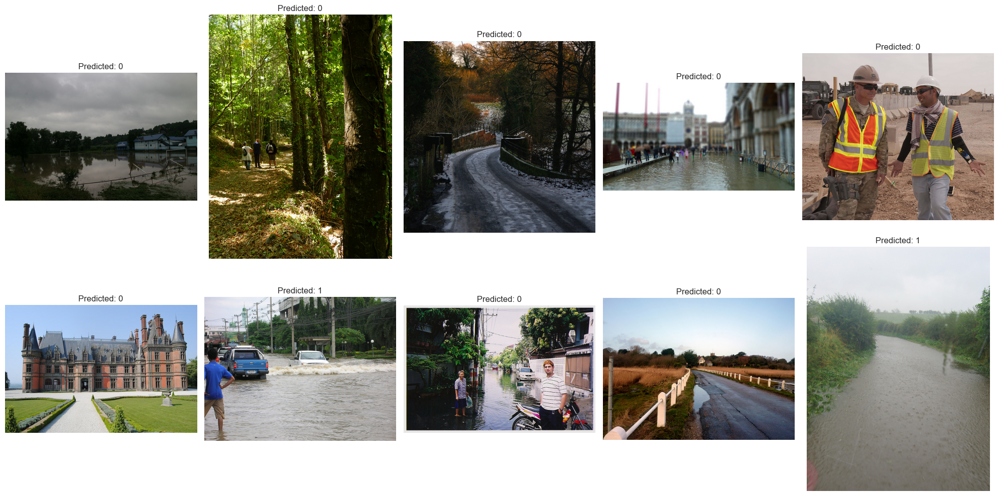

In [92]:
# Kích thước ảnh mà mô hình mong đợi
image_size = 256

# Hàm để đọc và xử lý hình ảnh
def load_and_preprocess_image(filepath, target_size):
    image = cv2.imread(filepath)
    image = cv2.resize(image, (target_size, target_size))
    image = image.astype('float32') / 255.0
    return image

# Đọc và xử lý tất cả các hình ảnh
test_images = np.array([load_and_preprocess_image(file, image_size) for file in test_df['full_path']])

# Đảm bảo rằng test_images có dạng (batch_size, height, width, channels)
print("Shape of test_images:", test_images.shape)

# Thực hiện dự đoán
predictions = model2.predict(test_images)

# Chuyển đổi dự đoán thành nhãn dự đoán (0 hoặc 1)
predicted_labels = (predictions > 0.5).astype(int)

# Nếu `predicted_labels` là một mảng 2D, chuyển nó thành mảng 1D
if predicted_labels.ndim == 2:
    predicted_labels = predicted_labels[:, 0]

# Lưu kết quả dự đoán vào DataFrame
test_df['predicted_label'] = predicted_labels

# Hiển thị hình ảnh cùng với nhãn dự đoán
def display_images_with_predictions(df):
    fig, axes = plt.subplots(nrows=2, ncols=5, figsize=(20, 10))
    axes = axes.flatten()
    for i, (idx, row) in enumerate(df.iterrows()):
        if i >= 10:
            break
        image = cv2.imread(row['full_path'])
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  # Chuyển đổi từ BGR sang RGB để hiển thị đúng màu
        axes[i].imshow(image)
        axes[i].set_title(f"Predicted: {row['predicted_label']}")
        axes[i].axis('off')
    plt.tight_layout()
    plt.show()

# Hiển thị hình ảnh cùng với nhãn dự đoán
display_images_with_predictions(test_df)

# Model 3 : Xception Model


In [19]:
from tensorflow.keras.applications import Xception
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Dropout
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPool2D, Flatten, Dense
from tensorflow.keras.metrics import Recall,AUC,Precision
from tensorflow.keras.utils import plot_model
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau

In [60]:
xception = Xception(include_top=False, input_shape = (image_size,image_size,image_channel), weights='imagenet')
input_to_model = xception.input
#turn off training
xception.trainable = False

x = Flatten()(xception.output)
x = Dense(64,activation = 'relu')(x)
output_to_model = Dense(2,activation = 'softmax')(x)
model3 = Model(inputs = input_to_model,outputs = output_to_model)

In [62]:
learning_rate_reduction = ReduceLROnPlateau(monitor = 'val_accuracy',
                                            patience=2,
                                            factor=0.5,
                                            min_lr = 0.00001,
                                            verbose = 1)

early_stoping = EarlyStopping(monitor='val_loss',patience= 2,restore_best_weights=True,verbose=0)

In [63]:
model3.compile(optimizer = 'adam',loss = 'binary_crossentropy',metrics = ['accuracy',Recall(),AUC(),Precision()])

In [64]:
# parameters
image_size = 256 # Size of the image
image_channel = 3 # Colour scale (RGB)
bat_size = 64 # Number of files/images processed at onc

In [65]:
history3 = model3.fit(train_generator,
                    validation_data = val_generator, 
                    callbacks=[learning_rate_reduction],
                    epochs = 15,
                    # steps_per_epoch = len(train_generator),
                    # validation_steps = len(val_generaotor),
                   )

Epoch 1/15
66/66 ━━━━━━━━━━━━━━━━━━━━ 813s 12s/step - accuracy: 0.7991 - auc_2: 0.8466 - loss: 1.8409 - precision_2: 0.7991 - recall_2: 0.7991 - val_accuracy: 0.8497 - val_auc_2: 0.9168 - val_loss: 0.3926 - val_precision_2: 0.8497 - val_recall_2: 0.8497 - learning_rate: 0.0010
Epoch 2/15
66/66 ━━━━━━━━━━━━━━━━━━━━ 801s 12s/step - accuracy: 0.8786 - auc_2: 0.9427 - loss: 0.2982 - precision_2: 0.8786 - recall_2: 0.8786 - val_accuracy: 0.8677 - val_auc_2: 0.9290 - val_loss: 0.3384 - val_precision_2: 0.8677 - val_recall_2: 0.8677 - learning_rate: 0.0010
Epoch 3/15
66/66 ━━━━━━━━━━━━━━━━━━━━ 896s 14s/step - accuracy: 0.8842 - auc_2: 0.9457 - loss: 0.2828 - precision_2: 0.8842 - recall_2: 0.8842 - val_accuracy: 0.8735 - val_auc_2: 0.9308 - val_loss: 0.3320 - val_precision_2: 0.8735 - val_recall_2: 0.8735 - learning_rate: 0.0010
Epoch 4/15
66/66 ━━━━━━━━━━━━━━━━━━━━ 897s 14s/step - accuracy: 0.9029 - auc_2: 0.9625 - loss: 0.2297 - precision_2: 0.9029 - recall_2: 0.9029 - val_accuracy: 0.8830 

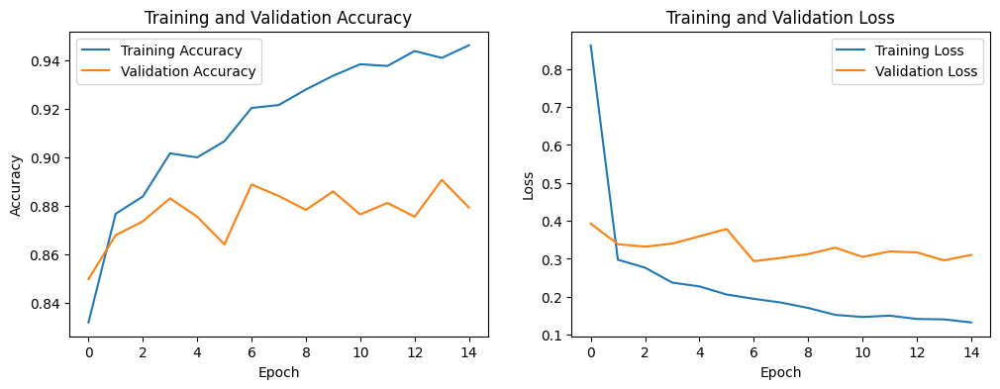

In [66]:
import matplotlib.pyplot as plt

# Vẽ biểu đồ các chỉ số từ lịch sử huấn luyện
plt.figure(figsize=(12, 4))

# Vẽ đồ thị Training và Validation Accuracy
plt.subplot(1, 2, 1)
plt.plot(history3.history['accuracy'], label='Training Accuracy')
plt.plot(history3.history['val_accuracy'], label='Validation Accuracy')
plt.title('Training and Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()

# Vẽ đồ thị Training và Validation Loss
plt.subplot(1, 2, 2)
plt.plot(history3.history['loss'], label='Training Loss')
plt.plot(history3.history['val_loss'], label='Validation Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

plt.show()


In [67]:
eval_list = model3.evaluate(val_generator,return_dict=True)
for metric in eval_list.keys():
    print(metric+f": {eval_list[metric]:.2f}")
    

17/17 ━━━━━━━━━━━━━━━━━━━━ 170s 10s/step - accuracy: 0.9058 - auc_2: 0.9580 - loss: 0.2439 - precision_2: 0.9058 - recall_2: 0.9058
accuracy: 0.90
auc_2: 0.95
loss: 0.26
precision_2: 0.90
recall_2: 0.90


In [119]:
# prediction
result = model3.predict(test_generator,batch_size = bat_size,verbose = 0)

y_pred = np.argmax(result, axis = 1)

y_true = test_generator.labels

# Evaluate
# Evaluate
evaluation_result = model3.evaluate(test_generator, batch_size=bat_size, verbose=0)
print('Evaluation result:', evaluation_result)


Evaluation result: [0.28829225897789, 0.883809506893158, 0.883809506893158, 0.9443119764328003]


In [123]:
loss_test = evaluation_result[0]
accuracy_test = evaluation_result[1]
print('Loss on testing data:', loss_test)
print('Accuracy on testing data:', accuracy_test*100)


Loss on testing data: 0.28829225897789
Accuracy on testing data: 88.3809506893158


Shape of test_images: (50, 256, 256, 3)
2/2 ━━━━━━━━━━━━━━━━━━━━ 7s 2s/step


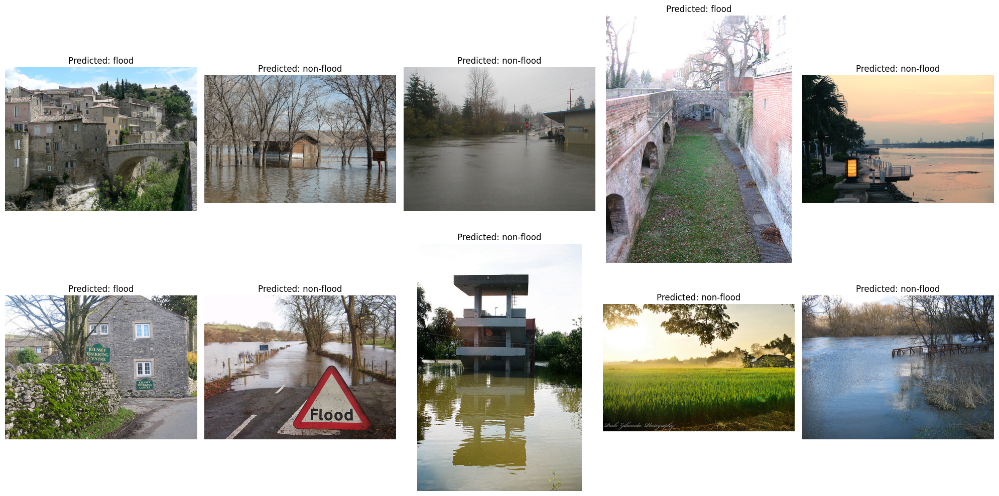

In [77]:
# Kích thước ảnh mà mô hình mong đợi
image_size = 256

# Hàm để đọc và xử lý hình ảnh
def load_and_preprocess_image(filepath, target_size):
    image = cv2.imread(filepath)
    image = cv2.resize(image, (target_size, target_size))
    image = image.astype('float32') / 255.0
    return image

# Đọc và xử lý tất cả các hình ảnh
test_images = np.array([load_and_preprocess_image(file, image_size) for file in test_df['full_path']])

# Đảm bảo rằng test_images có dạng (batch_size, height, width, channels)
print("Shape of test_images:", test_images.shape)

# Thực hiện dự đoán
predictions = model3.predict(test_images)

# Chuyển đổi dự đoán thành nhãn dự đoán (0 hoặc 1)
predicted_labels = (predictions > 0.5).astype(int)

# Nếu `predicted_labels` là một mảng 2D, chuyển nó thành mảng 1D
if predicted_labels.ndim == 2:
    predicted_labels = predicted_labels[:, 0]

# Lưu kết quả dự đoán vào DataFrame
test_df['predicted_label'] = predicted_labels

# Hiển thị hình ảnh cùng với nhãn dự đoán
def display_images_with_predictions(df):
    fig, axes = plt.subplots(nrows=2, ncols=5, figsize=(20, 10))
    axes = axes.flatten()
    for i, (idx, row) in enumerate(df.iterrows()):
        if i >= 10:
            break
        image = cv2.imread(row['full_path'])
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  # Chuyển đổi từ BGR sang RGB để hiển thị đúng màu
        axes[i].imshow(image)
        axes[i].set_title(f"Predicted: {'flood' if row['predicted_label'] == 1 else 'non-flood'}")
        axes[i].axis('off')
    plt.tight_layout()
    plt.show()

# Hiển thị hình ảnh cùng với nhãn dự đoán
display_images_with_predictions(test_df)


In [78]:
model3.save('model3_ver1.h5')

Shape of test_images: (1320, 256, 256, 3)
42/42 ━━━━━━━━━━━━━━━━━━━━ 224s 5s/step


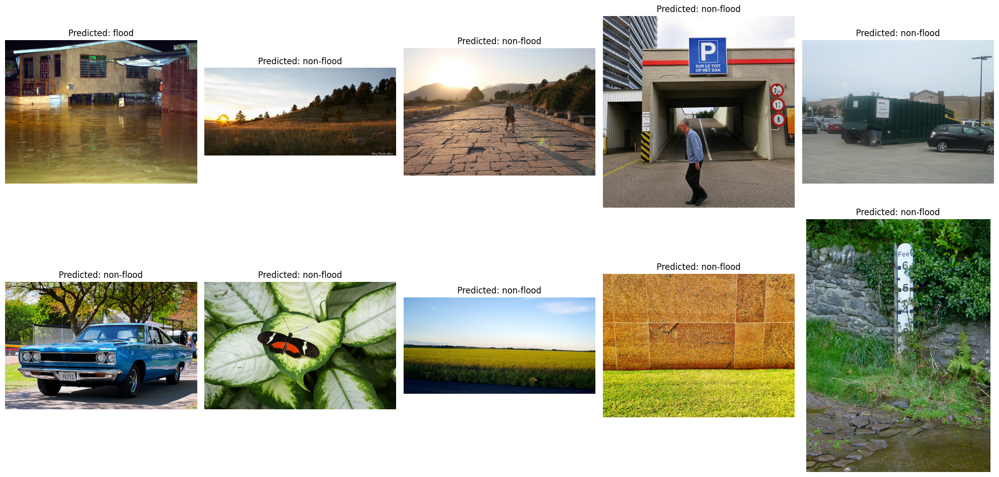

In [84]:
import tensorflow as tf
import numpy as np
import pandas as pd
import cv2
import matplotlib.pyplot as plt
import os

# Đường dẫn tới mô hình đã lưu
model_path = r'C:\Users\Admin\Documents\DPL302m\Kaggle competition\model_weights\model3_ver1.h5'

# Load mô hình
model = tf.keras.models.load_model(model_path)

# Kích thước ảnh mà mô hình mong đợi
image_size = 256

# Hàm để đọc và xử lý hình ảnh
def load_and_preprocess_image(filepath, target_size):
    image = cv2.imread(filepath)
    image = cv2.resize(image, (target_size, target_size))
    image = image.astype('float32') / 255.0
    return image

# Đường dẫn tới thư mục chứa các ảnh test
test_dir = r"C:\Users\Admin\Documents\DPL302m\Kaggle competition\Flood Data\testset_images"

# Tạo danh sách các file ảnh trong thư mục test
test_files = [os.path.join(test_dir, file) for file in os.listdir(test_dir) if file.endswith(('.png', '.jpg', '.jpeg'))]

# Tạo DataFrame từ danh sách file ảnh
test_df = pd.DataFrame({'full_path': test_files})

# Đọc và xử lý tất cả các hình ảnh
test_images = np.array([load_and_preprocess_image(file, image_size) for file in test_df['full_path']])

# Đảm bảo rằng test_images có dạng (batch_size, height, width, channels)
print("Shape of test_images:", test_images.shape)

# Thực hiện dự đoán
predictions = model.predict(test_images)

# Chuyển đổi dự đoán thành nhãn dự đoán (0 hoặc 1)
predicted_labels = (predictions > 0.5).astype(int)

# Nếu `predicted_labels` là một mảng 2D, chuyển nó thành mảng 1D
if predicted_labels.ndim == 2:
    predicted_labels = predicted_labels[:, 0]

# Lưu kết quả dự đoán vào DataFrame
test_df['predicted_label'] = predicted_labels

# Hiển thị hình ảnh cùng với nhãn dự đoán
def display_images_with_predictions(df):
    fig, axes = plt.subplots(nrows=2, ncols=5, figsize=(20, 10))
    axes = axes.flatten()
    for i, (idx, row) in enumerate(df.iterrows()):
        if i >= 10:
            break
        image = cv2.imread(row['full_path'])
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  # Chuyển đổi từ BGR sang RGB để hiển thị đúng màu
        axes[i].imshow(image)
        axes[i].set_title(f"Predicted: {'flood' if row['predicted_label'] == 0 else 'non-flood'}")
        axes[i].axis('off')
    plt.tight_layout()
    plt.show()

# Hiển thị hình ảnh cùng với nhãn dự đoán
display_images_with_predictions(test_df)


In [86]:
import os
import pandas as pd
import numpy as np
from tensorflow.keras.models import load_model
import cv2

# Đường dẫn đến thư mục chứa ảnh test
test_path =  r"C:\Users\Admin\Documents\DPL302m\Kaggle competition\Flood Data\New folder"

# Đường dẫn đến file mô hình đã lưu
model_path = R'C:\Users\Admin\Documents\DPL302m\Kaggle competition\model_weights\model3_ver.h5'

# Tải mô hình đã huấn luyện
model = load_model(model_path)

# Hàm để dự đoán nhãn cho một ảnh
def predict_image(img_path, model, image_size=(256, 256)):
    img = cv2.imread(img_path)
    img = cv2.resize(img, image_size)
    img = img / 255.0
    img = np.expand_dims(img, axis=0)
    prediction = model.predict(img)
    label = np.argmax(prediction, axis=1)[0]
    return label

# Danh sách để lưu kết quả dự đoán
results = []

# Duyệt qua các ảnh trong thư mục test
for img_name in os.listdir(test_path):
    img_path = os.path.join(test_path, img_name)
    label = predict_image(img_path, model)
    results.append([img_name, label])

# Chuyển kết quả thành DataFrame và lưu ra file CSV
results_df = pd.DataFrame(results, columns=['id', 'label'])
results_df.to_csv('test_predictions1.csv', index=False)

print("Predictions saved to test_predictions.csv")


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 167ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 174ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 171ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 177ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 165ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 186ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 188ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 172ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 192ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 178ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 189ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 168ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 172ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 190ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 190ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 186ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 176ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 177ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 

In [ ]:
import os
import pandas as pd
import numpy as np
from tensorflow.keras.models import load_model
import cv2

# Đường dẫn đến thư mục chứa ảnh test
test_path =  r"C:\Users\Admin\Documents\DPL302m\Kaggle competition\Flood Data\testset_images"

# Đường dẫn đến file mô hình đã lưu
model_path = r'C:\Users\Admin\Documents\DPL302m\Kaggle competition\model_weights\model3_ver1.h5'

# Tải mô hình đã huấn luyện
model = load_model(model_path)

# Hàm để dự đoán nhãn cho một ảnh
def predict_image(img_path, model, image_size=(256, 256)):
    img = cv2.imread(img_path)
    img = cv2.resize(img, image_size)
    img = img / 255.0
    img = np.expand_dims(img, axis=0)
    prediction = model.predict(img)
    label = np.argmax(prediction, axis=1)[0]
    return label

# Danh sách để lưu kết quả dự đoán
results = []

# Duyệt qua các ảnh trong thư mục test
for img_name in os.listdir(test_path):
    img_path = os.path.join(test_path, img_name)
    label = predict_image(img_path, model)
    results.append([img_name, label])

# Chuyển đổi nhãn 0 và 1 thành 'non-flood' và 'flood'
for result in results:
    if result[1] == 0:
        result[1] = 'non-flood'
    else:
        result[1] = 'flood'

# Chuyển kết quả thành DataFrame và lưu ra file CSV
results_df = pd.DataFrame(results, columns=['id', 'label'])
results_df.to_csv('test_predictions.csv', index=False)

print("Predictions saved to test_predictions1.csv")


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 167ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 169ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 175ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 170ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 166ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 178ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 171ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 166ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 175ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 181ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 172ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 178ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 197ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 176ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 171ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 202ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 231ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 214ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 226ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 374ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 190ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 

# ResNet50 Model:

In [18]:
from tensorflow.keras.applications import ResNet50
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D

In [19]:
# Tải mô hình ResNet50 với các trọng số đã được huấn luyện trên ImageNet
base_model = ResNet50(weights='imagenet', include_top=False, input_shape=(256, 256, 3))

In [24]:
# Thêm các lớp cuối cùng để điều chỉnh cho bài toán của bạn
x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dense(1024, activation='relu')(x)
predictions = Dense(2, activation='softmax')(x)


# Xây dựng mô hình hoàn chỉnh
model_ResNet50 = Model(inputs=base_model.input, outputs=predictions)

In [20]:
# # Unfreeze một số lớp của mô hình gốc và tiếp tục huấn luyện
# for layer in base_model.layers[-10:]:
#     layer.trainable = True

# # Biên dịch lại mô hình với tốc độ học thấp hơn
# from tensorflow.keras.optimizers import Adam
# model_ResNet50.compile(optimizer=Adam(learning_rate=1e-5), loss='binary_crossentropy', metrics=['accuracy'])


In [26]:
learning_rate_reduction = ReduceLROnPlateau(monitor = 'val_accuracy',
                                            patience=2,
                                            factor=0.5,
                                            min_lr = 0.00001,
                                            verbose = 1)

early_stoping = EarlyStopping(monitor='val_loss',patience= 2,restore_best_weights=True,verbose=0)

In [28]:
# Đóng băng các lớp của mô hình gốc
for layer in base_model.layers:
    layer.trainable = False

# Biên dịch mô hình
model_ResNet50.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

In [29]:
# Tiếp tục huấn luyện
history4 = model_ResNet50.fit(train_generator, 
                              epochs=10,
                              validation_data=val_generator,
                              callbacks=[learning_rate_reduction])


Epoch 1/10
33/33 ━━━━━━━━━━━━━━━━━━━━ 644s 18s/step - accuracy: 0.5848 - loss: 0.8730 - val_accuracy: 0.6388 - val_loss: 0.6382 - learning_rate: 0.0010
Epoch 2/10
33/33 ━━━━━━━━━━━━━━━━━━━━ 574s 17s/step - accuracy: 0.6383 - loss: 0.6294 - val_accuracy: 0.6369 - val_loss: 0.6151 - learning_rate: 0.0010
Epoch 3/10
33/33 ━━━━━━━━━━━━━━━━━━━━ 575s 17s/step - accuracy: 0.6470 - loss: 0.6106 - val_accuracy: 0.6882 - val_loss: 0.5928 - learning_rate: 0.0010
Epoch 4/10
33/33 ━━━━━━━━━━━━━━━━━━━━ 572s 17s/step - accuracy: 0.6527 - loss: 0.6165 - val_accuracy: 0.7015 - val_loss: 0.5943 - learning_rate: 0.0010
Epoch 5/10
33/33 ━━━━━━━━━━━━━━━━━━━━ 9572s 298s/step - accuracy: 0.6550 - loss: 0.6183 - val_accuracy: 0.7205 - val_loss: 0.5803 - learning_rate: 0.0010
Epoch 6/10
11/33 ━━━━━━━━━━━━━━━━━━━━ 5:33 15s/step - accuracy: 0.6525 - loss: 0.6112

KeyboardInterrupt: 

In [1]:
import numpy as np

# Tạo mảng một chiều
arr1 = np.array([1, 2, 3, 4, 5])
print("Mảng một chiều:", arr1)

# Tạo mảng hai chiều
arr2 = np.array([[1, 2, 3], [4, 5, 6]])
print("Mảng hai chiều:\n", arr2)


Mảng một chiều: [1 2 3 4 5]
Mảng hai chiều:
 [[1 2 3]
 [4 5 6]]


In [2]:
# Lấy kích thước của mảng
print("Kích thước của arr1:", arr1.shape)
print("Kích thước của arr2:", arr2.shape)

# Truy cập phần tử
print("Phần tử đầu tiên của arr1:", arr1[0])
print("Phần tử ở hàng 1, cột 2 của arr2:", arr2[0, 1])

# Thay đổi giá trị của phần tử
arr1[0] = 10
print("arr1 sau khi thay đổi:", arr1)

# Slicing (cắt mảng)
print("Các phần tử từ 1 đến 3 của arr1:", arr1[1:4])
print("Hàng đầu tiên của arr2:", arr2[0, :])
print("Cột thứ hai của arr2:", arr2[:, 1])


Kích thước của arr1: (5,)
Kích thước của arr2: (2, 3)
Phần tử đầu tiên của arr1: 1
Phần tử ở hàng 1, cột 2 của arr2: 2
arr1 sau khi thay đổi: [10  2  3  4  5]
Các phần tử từ 1 đến 3 của arr1: [2 3 4]
Hàng đầu tiên của arr2: [1 2 3]
Cột thứ hai của arr2: [2 5]


In [3]:
# Tạo mảng với các giá trị ngẫu nhiên
random_arr = np.random.rand(3, 3)
print("Mảng ngẫu nhiên:\n", random_arr)

# Tạo mảng với các số 0
zero_arr = np.zeros((2, 3))
print("Mảng toàn số 0:\n", zero_arr)

# Tạo mảng với các số 1
ones_arr = np.ones((2, 3))
print("Mảng toàn số 1:\n", ones_arr)

# Tạo mảng với các giá trị nằm trong khoảng
range_arr = np.arange(0, 10, 2)
print("Mảng với các giá trị từ 0 đến 10 cách nhau 2:", range_arr)

# Tạo mảng với các giá trị cách đều nhau
linspace_arr = np.linspace(0, 1, 5)
print("Mảng với 5 giá trị cách đều từ 0 đến 1:", linspace_arr)


Mảng ngẫu nhiên:
 [[0.55127364 0.12423307 0.58413181]
 [0.82419625 0.54202858 0.41228846]
 [0.50274955 0.95676472 0.09940387]]
Mảng toàn số 0:
 [[0. 0. 0.]
 [0. 0. 0.]]
Mảng toàn số 1:
 [[1. 1. 1.]
 [1. 1. 1.]]
Mảng với các giá trị từ 0 đến 10 cách nhau 2: [0 2 4 6 8]
Mảng với 5 giá trị cách đều từ 0 đến 1: [0.   0.25 0.5  0.75 1.  ]


In [5]:
import pandas as pd

# Tạo Series
s = pd.Series([1, 3, 5, 7, 9])
print("Series:\n", s)

# Tạo DataFrame từ dictionary
data = {
    'Name': ['Alice', 'Bob', 'Charlie', 'David', 'Eva'],
    'Age': [24, 27, 22, 32, 29],
    'City': ['New York', 'Los Angeles', 'Chicago', 'Houston', 'Phoenix']
}
df = pd.DataFrame(data)
print("DataFrame:\n")
df


Series:
 0    1
1    3
2    5
3    7
4    9
dtype: int64
DataFrame:



,Name,Age,City
0,Alice,24,New York
1,Bob,27,Los Angeles
2,Charlie,22,Chicago
3,David,32,Houston
4,Eva,29,Phoenix


In [7]:
import numpy as np

# Tạo mảng NumPy
arr = np.array([1, 2, 3, 4, 5])
print("Mảng NumPy:", arr)

# Tính toán trên mảng
print("Mảng sau khi nhân với 2:", arr * 2)

# Tính sin của các phần tử trong mảng
print("Sin của các phần tử:", np.sin(arr))


Mảng NumPy: [1 2 3 4 5]
Mảng sau khi nhân với 2: [ 2  4  6  8 10]
Sin của các phần tử: [ 0.84147098  0.90929743  0.14112001 -0.7568025  -0.95892427]


In [8]:
import pandas as pd

# Tạo DataFrame
data = {
    'Name': ['Alice', 'Bob', 'Charlie', 'David', 'Eva'],
    'Age': [24, 27, 22, 32, 29],
    'City': ['New York', 'Los Angeles', 'Chicago', 'Houston', 'Phoenix']
}
df = pd.DataFrame(data)
print("DataFrame Pandas:\n", df)

# Chọn cột Age
print("Cột Age:\n", df['Age'])

# Lọc các dòng có Age lớn hơn 25
filtered_df = df[df['Age'] > 25]
print("Các dòng có Age > 25:\n", filtered_df)

# Tính giá trị trung bình của cột Age
print("Giá trị trung bình của Age:", df['Age'].mean())


DataFrame Pandas:
       Name  Age         City
0    Alice   24     New York
1      Bob   27  Los Angeles
2  Charlie   22      Chicago
3    David   32      Houston
4      Eva   29      Phoenix
Cột Age:
 0    24
1    27
2    22
3    32
4    29
Name: Age, dtype: int64
Các dòng có Age > 25:
     Name  Age         City
1    Bob   27  Los Angeles
3  David   32      Houston
4    Eva   29      Phoenix
Giá trị trung bình của Age: 26.8
